## Importar librerias

In [ ]:
import hashlib
import shutil

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch

from pathlib import Path
from PIL import Image
from skimage import img_as_float
from skimage.feature import hessian_matrix, hessian_matrix_eigvals
from skimage.filters import frangi, meijering
from skimage.restoration import denoise_tv_chambolle
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

In [ ]:
print("CUDA disponible:", torch.cuda.is_available())
print("GPU en uso:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No hay GPU")

CUDA disponible: True
GPU en uso: Tesla T4


## Configuracion previa

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
base_path = Path("/content/drive/MyDrive/Pregrado - Posgrado - Trabajo/Maestría - Inteligencia Artificial Aplicada/13. Proyecto integrador/Myotubes/data/raw/")
out_path  = base_path.parent / "raw_all"

out_images = out_path / "images"

out_images.mkdir(parents=True, exist_ok=True)

In [ ]:
def load_image_paths(folder_path):
    """Obtiene todas las rutas de imágenes .png en la carpeta."""
    return sorted(list(folder_path.glob("*.png")))

## Feature Engineering y Preprocesamiento
En esta etapa, el objetivo principal es realizar una ingeniería de atributos (Feature Engineering) aplicada a imágenes de microscopía. El problema central radica en que los miotubos presentan un bajo contraste y una relación señal-ruido (SNR) reducida, lo que dificulta la capacidad de generalización de un modelo de detección.

Nuestra intención es evaluar y aplicar una serie de filtros deterministas que resalten los atributos morfológicos clave de las entidades celulares. Buscamos facilitar el trabajo del modelo durante el entrenamiento, permitiéndole enfocarse en la geometría de los miotubos en lugar de gastar capacidad de aprendizaje en filtrar el ruido de fondo.

En lugar de alimentar al modelo con una imagen original en un solo canal de escala de grises, hemos diseñado un proceso para generar un stack de canales. Este enfoque nos permite pasar de un input plano a un tensor de tres dimensiones, donde cada canal aporta información complementaria y especializada.

Nota Metodológica: Este proceso se entiende como una mejora estratégica del input. Al procesar las imágenes de forma orientada a la detección de miotubos, reducimos la varianza de los datos y proporcionamos al modelo atributos pre-extraídos.

A continuacion, probamos multiples filtros diferentes para identificar cuales pueden ser los de mayor utilidad en el stack final para este tipo de imagenes en especfico.

1. CLAHE (Contrast Limited Adaptive Histogram Equalization)
Propósito: Optimizar el contraste local y normalizar el rango dinámico de la captura original.

Justificación: Las imágenes de microscopía suelen presentar una iluminación plana y un contraste reducido, lo que oculta fibras celulares que son críticas para la detección. A diferencia de una ecualización global, CLAHE opera en pequeñas regiones (tiles) para resaltar texturas sutiles sin amplificar excesivamente el ruido de fondo, permitiendo que los miotubos más tenues se vuelvan visibles para el modelo.

Mostrando resultado para: 0062917b-195893df-aa40-4944-8592-2fa62f94d608_B2_02_03_Best.png


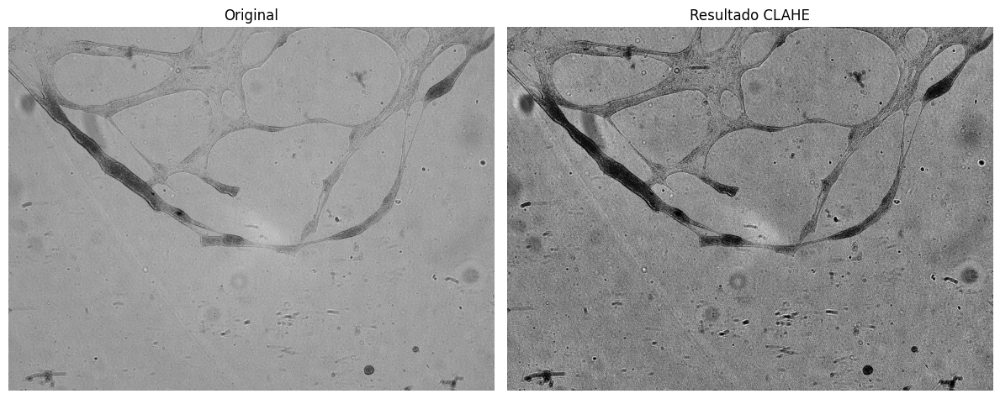

In [ ]:
def apply_clahe(image, clip_limit=3.0, tile_grid_size=(8, 8)):
    """
    Aplica el ecualizado de histograma adaptativo limitado por contraste.
    clip_limit: Umbral para el límite de contraste.
    tile_grid_size: Tamaño de la cuadrícula para el histograma local.
    """
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image

    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    return clahe.apply(gray)

def visualize_comparison(original, processed, title="Procesamiento"):
    """Muestra una comparativa entre la imagen original y la procesada."""
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.title("Original")
    plt.imshow(original, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title(title)
    plt.imshow(processed, cmap='gray')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# 1. Obtener lista de imágenes
all_images = load_image_paths(out_images)

if not all_images:
    print(f"No se encontraron imágenes PNG en: {base_path}")
else:
    # 2. Leer la primera imagen para la prueba
    sample_path = all_images[2]
    img = cv2.imread(str(sample_path))

    # 3. Aplicar el primer método: CLAHE
    img_clahe = apply_clahe(img)

    # 4. Visualizar
    print(f"Mostrando resultado para: {sample_path.name}")
    visualize_comparison(img, img_clahe, title="Resultado CLAHE")

2. Filtro de Frangi (Vesselness)
Propósito: Resaltar estructuras tubulares y filamentosas mediante el análisis de la geometría local de la imagen.

Justificación: Debido a que los miotubos poseen una morfología elongada y ramificada, el filtro de Frangi es ideal para detectar estas formas de "vesselness". Este método utiliza los valores propios de la matriz Hessiana para calcular la probabilidad de que un píxel pertenezca a una estructura tubular, lo que permite discriminar y potenciar las fibras de interés mientras se suprime el ruido amorfo o circular presente en el fondo.

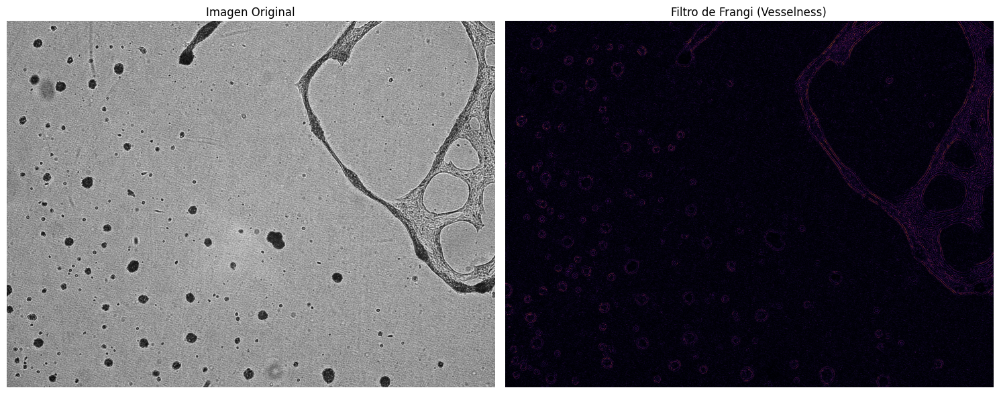

In [ ]:

def apply_frangi(image, scale_range=(1, 10), scale_step=2):
    """
    Aplica el filtro de Frangi para resaltar estructuras tubulares.
    sigmas: Rango de escalas (grosores) que buscará el filtro.
    """
    # El filtro de Frangi de skimage espera valores normalizados o floats
    # Se define el rango de sigmas para cubrir diferentes grosores de miotubos
    sigmas = np.arange(scale_range[0], scale_range[1], scale_step)

    # Aplicamos el filtro
    frangi_img = frangi(image, sigmas=sigmas, black_ridges=True)

    # Re-escalamos a 0-255 para mantener consistencia
    frangi_img_rescaled = cv2.normalize(frangi_img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    return frangi_img_rescaled

# --- Bloque de Prueba ---

if 'all_images' in locals() and all_images:
    # 1. Cargar original
    original = cv2.imread(str(all_images[4]), 0)

    # 2. Pipeline Recomendado:
    # Denoising -> CLAHE (opcional) -> Frangi
    # Es vital quitar el ruido antes porque Frangi usa derivadas segundas.
    denoised = cv2.fastNlMeansDenoising(original, None, h=7)

    # 3. Aplicar Frangi
    # Nota: Ajusta sigmas=(1, 15) si los miotubos son muy gruesos en tus imágenes
    img_frangi = apply_frangi(denoised, scale_range=(1, 8), scale_step=1)

    # --- Visualización ---
    plt.figure(figsize=(15, 7))

    plt.subplot(1, 2, 1)
    plt.title("Imagen Original")
    plt.imshow(original, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title("Filtro de Frangi (Vesselness)")
    plt.imshow(img_frangi, cmap='inferno') # 'inferno' ayuda a ver mejor el relieve
    plt.axis('off')

    plt.tight_layout()
    plt.show()

3. Operaciones Morfológicas (Closing & Top-Hat)
Propósito: Corregir imperfecciones estructurales en las fibras y estandarizar la iluminación del fondo.

Justificación:

Cierre (Closing): Esta operación es fundamental para solidificar la red de miotubos, ya que permite unir segmentos que aparecen fragmentados debido a la baja señal o ruido de la captura. Al rellenar pequeños huecos internos, se genera una estructura continua que facilita la definición de cajas de detección (bounding boxes) precisas.

Top-Hat: Actúa como un extractor de características brillantes sobre fondos oscuros, eliminando gradientes de iluminación no deseados y "aplanando" el fondo. Es una herramienta clave para asegurar que solo las estructuras de interés (miotubos) mantengan una intensidad alta antes de los pasos de binarización.

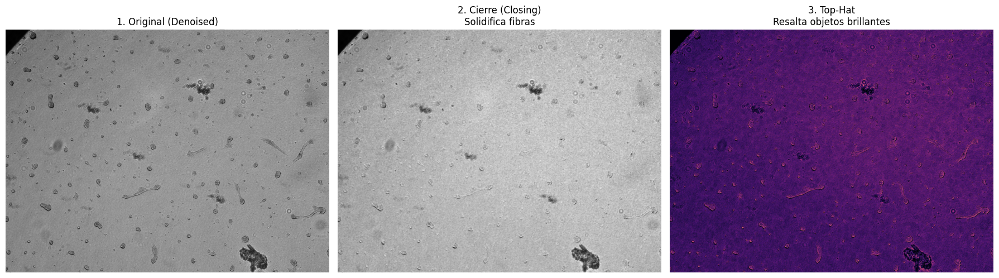

In [ ]:


def apply_morphology_ops(image, kernel_size=5, op_type='closing'):
    """
    Aplica operaciones morfológicas para limpiar o resaltar estructuras.
    kernel_size: Tamaño del elemento estructurante (ajustar según el grosor del miotubo).
    op_type: 'closing' para rellenar huecos, 'tophat' para extraer objetos brillantes sobre fondo oscuro.
    """
    # Creamos el elemento estructurante (un círculo o elipse suele ser mejor para células)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))

    if op_type == 'closing':
        # Cierre: Dilatación seguida de Erosión. Une partes rotas.
        result = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    elif op_type == 'tophat':
        # Top-Hat: Imagen original menos su apertura. Extrae solo los miotubos brillantes.
        result = cv2.morphologyEx(image, cv2.MORPH_TOPHAT, kernel)
    else:
        result = image

    return result

# --- Bloque de Prueba ---

if 'all_images' in locals() and all_images:
    # 1. Cargar original y aplicar un pre-limpiado leve
    original = cv2.imread(str(all_images[0]), 0)
    denoised = cv2.fastNlMeansDenoising(original, None, h=7)

    # 2. Aplicar Cierre (para solidificar los miotubos)
    # Si tus miotubos son muy anchos, puedes subir el kernel a 7 o 9
    img_closed = apply_morphology_ops(denoised, kernel_size=7, op_type='closing')

    # 3. Aplicar Top-Hat (para ver solo las estructuras de interés)
    # El kernel aquí debe ser mayor que el grosor del miotubo más ancho
    img_tophat = apply_morphology_ops(denoised, kernel_size=25, op_type='tophat')

    # --- Visualización ---
    plt.figure(figsize=(18, 6))

    plt.subplot(1, 3, 1)
    plt.title("1. Original (Denoised)")
    plt.imshow(denoised, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title("2. Cierre (Closing)\nSolidifica fibras")
    plt.imshow(img_closed, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("3. Top-Hat\nResalta objetos brillantes")
    plt.imshow(img_tophat, cmap='magma') # Magma ayuda a ver intensidades bajas
    plt.axis('off')

    plt.tight_layout()
    plt.show()

4. Umbralización Adaptativa (Gaussian)
Propósito: Segmentar la imagen de forma binaria utilizando umbrales locales calculados dinámicamente para cada región de la captura.

Justificación: En condiciones donde la iluminación no es uniforme, un umbral global (como Otsu) tiende a perder detalles en zonas de baja intensidad. La umbralización adaptativa permite rescatar fibras de miotubos más tenues al considerar únicamente el entorno local del píxel, lo que resulta útil para evaluar la conectividad de la red, a pesar del incremento de ruido granular en el fondo que suele introducir este método.

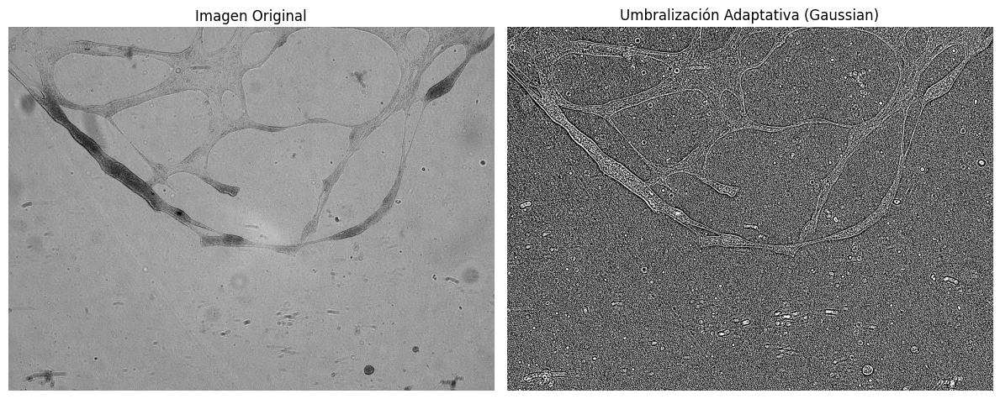

In [ ]:
def apply_adaptive_threshold(image, block_size=11, c=2):
    """
    Aplica umbralización adaptativa gaussiana.
    block_size: Tamaño del área local (debe ser impar: 3, 5, 11, etc.).
    c: Constante que se resta de la media (ayuda a eliminar ruido residual).
    """
    # Es vital que la imagen sea uint8
    if image.dtype != np.uint8:
        image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    return cv2.adaptiveThreshold(
        image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY_INV, block_size, c
    )

# --- Bloque de Prueba ---
if 'all_images' in locals() and all_images:
    original = cv2.imread(str(all_images[2]), 0)

    # 1. Antes de la umbralización, un suavizado ligero ayuda a reducir ruido
    blurred = cv2.GaussianBlur(original, (5, 5), 0)

    # 2. Aplicamos la umbralización adaptativa
    # Si ves que es muy sensible, aumenta el valor de 'c'
    # Si los miotubos son anchos, aumenta 'block_size'
    adaptive_mask = apply_adaptive_threshold(blurred, block_size=25, c=3)

    # --- Visualización ---
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.title("Imagen Original")
    plt.imshow(original, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title("Umbralización Adaptativa (Gaussian)")
    plt.imshow(adaptive_mask, cmap='gray')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

5. Filtro de Meijering (Neuriteness)
Propósito: Optimizar la detección de estructuras filamentosas y ramificadas que presentan intensidades muy bajas o variables.

Justificación: El filtro de Meijering fue diseñado específicamente para identificar neuritas y estructuras tubulares en imágenes biomédicas ruidosas. Se decidió probar este método debido a que es menos sensible a los cambios de brillo a lo largo de la fibra que otros filtros Hessian-based, lo que permite mantener una mejor continuidad en la red de miotubos. Su capacidad para resaltar la morfología sin generar halos o artefactos excesivos lo convierte en un atributo de alta calidad para facilitar la localización de las entidades celulares.

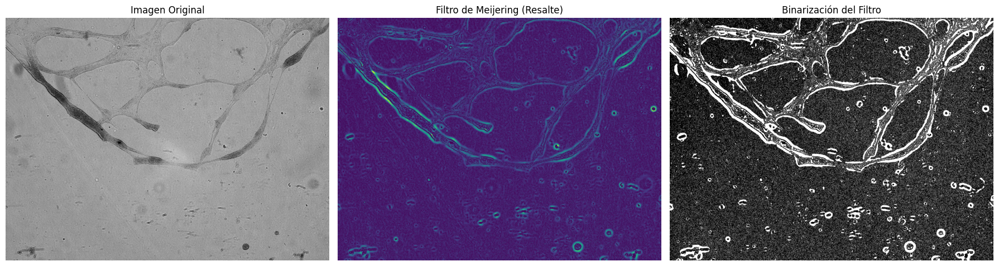

In [ ]:
def apply_meijering(image, sigmas=range(1, 12, 2)):
    """
    Aplica el filtro de Meijering para resaltar estructuras filamentosas.
    sigmas: Escalas de búsqueda. Para miotubos finos, sigmas bajos; para gruesos, altos.
    """
    # El filtro de Meijering funciona mejor con floats.
    # black_ridges=False porque los miotubos suelen ser más claros que el fondo.
    meij_img = meijering(image, sigmas=sigmas, black_ridges=False, mode='reflect')

    # Normalizamos el resultado a 0-255
    return cv2.normalize(meij_img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# --- Bloque de Prueba ---
if 'all_images' in locals() and all_images:
    # 1. Cargar imagen original
    original = cv2.imread(str(all_images[2]), 0)

    # 2. Pre-procesamiento: Un suavizado muy ligero para evitar resaltar ruido
    # El filtro de Meijering es sensible al ruido de alta frecuencia.
    blurred = cv2.GaussianBlur(original, (3, 3), 0)

    # 3. Aplicar Meijering
    # Ajusta el rango de sigmas según el grosor que veas en tus imágenes.
    img_meijering = apply_meijering(blurred, sigmas=range(1, 10, 2))

    # 4. Opcional: Aplicar un umbral suave para ver la red más clara
    _, mask = cv2.threshold(img_meijering, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # --- Visualización ---
    plt.figure(figsize=(18, 6))

    plt.subplot(1, 3, 1)
    plt.title("Imagen Original")
    plt.imshow(original, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title("Filtro de Meijering (Resalte)")
    plt.imshow(img_meijering, cmap='viridis') # Viridis ayuda a ver gradientes tenues
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("Binarización del Filtro")
    plt.imshow(mask, cmap='gray')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

6. Difusión Anisotrópica (Perona-Malik) y Variación Total (TV)
Propósito: Reducir el ruido de alta frecuencia y suavizar texturas de fondo preservando estrictamente la nitidez de los bordes y la conectividad de las fibras.

Justificación: * Difusión Anisotrópica: A diferencia de los suavizados convencionales (como el Gaussiano) que borran detalles finos, este método permite una "difusión de coherencia". Esto significa que el filtro suaviza la imagen preferencialmente en las zonas donde no detecta bordes, permitiendo limpiar el granulado del fondo sin difuminar los límites de los miotubos tenues.

Variación Total (TV): Se evaluó esta técnica por su capacidad para eliminar el ruido manteniendo las discontinuidades bruscas de la imagen. Es una herramienta de regularización que favorece soluciones "planas por partes", lo cual ayuda a estandarizar el fondo de microscopía y facilita que el modelo de detección distinga la entidad celular del entorno ruidoso.

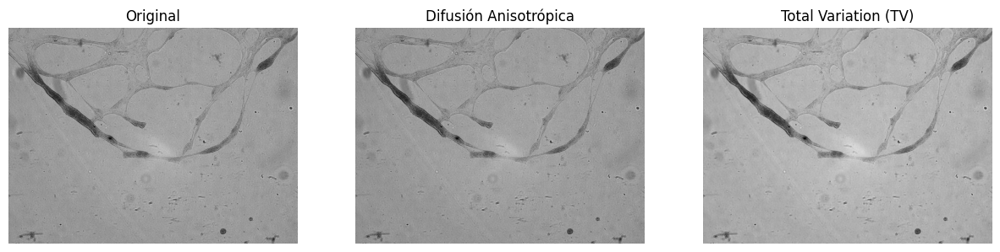

In [ ]:
def apply_anisotropic_diffusion(image, iterations=10, kappa=50, gamma=0.1):
    """
    Simula la difusión de coherencia (Perona-Malik).
    iterations: Número de veces que se aplica el flujo.
    kappa: Controla la sensibilidad a los bordes (más alto = más suavizado).
    gamma: Velocidad de difusión.
    """
    img = image.astype(np.float32)
    for i in range(iterations):
        # Gradientes
        grad_north = np.roll(img, -1, axis=0) - img
        grad_south = np.roll(img, 1, axis=0) - img
        grad_east = np.roll(img, -1, axis=1) - img
        grad_west = np.roll(img, 1, axis=1) - img

        # Coeficientes de conducción
        c_n = np.exp(-(grad_north/kappa)**2)
        c_s = np.exp(-(grad_south/kappa)**2)
        c_e = np.exp(-(grad_east/kappa)**2)
        c_w = np.exp(-(grad_west/kappa)**2)

        img += gamma * (c_n*grad_north + c_s*grad_south + c_e*grad_east + c_w*grad_west)

    return cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# --- Prueba del Filtro ---
if 'all_images' in locals() and all_images:
    original = cv2.imread(str(all_images[2]), 0)

    # Aplicamos difusión
    img_diffused = apply_anisotropic_diffusion(original, iterations=15, kappa=20)

    # También probamos Total Variation (TV) que es excelente para microscopía
    img_tv = denoise_tv_chambolle(original, weight=0.1)
    img_tv = (img_tv * 255).astype(np.uint8)

    plt.figure(figsize=(15, 7))
    plt.subplot(1, 3, 1); plt.title("Original"); plt.imshow(original, cmap='gray'); plt.axis('off')
    plt.subplot(1, 3, 2); plt.title("Difusión Anisotrópica"); plt.imshow(img_diffused, cmap='gray'); plt.axis('off')
    plt.subplot(1, 3, 3); plt.title("Total Variation (TV)"); plt.imshow(img_tv, cmap='gray'); plt.axis('off')
    plt.show()

7. Banco de Filtros de Gabor
Propósito: Extraer y resaltar características basadas en texturas orientadas para capturar la red de miotubos independientemente de su dirección de crecimiento.

Justificación: Las fibras celulares se distribuyen de forma aleatoria en el espacio, formando una red compleja con múltiples orientaciones. Los filtros de Gabor simulan la respuesta del córtex visual humano ante líneas y bordes, permitiendo potenciar la señal de estructuras que poseen una frecuencia espacial definida. Al consolidar la respuesta máxima de un banco de filtros (8 ángulos diferentes), logramos una representación que unifica la estructura de las fibras y suprime el ruido no orientado, facilitando la detección de la entidad biológica.

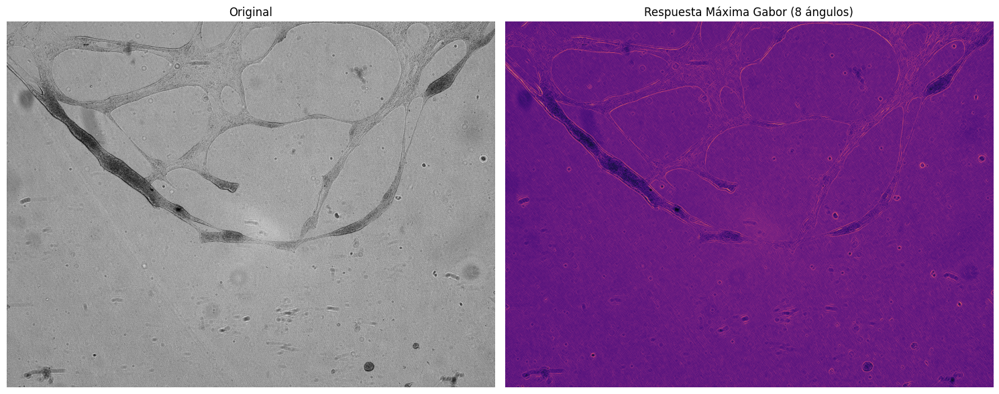

In [ ]:


def apply_gabor_bank(image, ksize=31, sigma=4.0, lambd=10.0, gamma=0.5, psi=0):
    """
    Aplica un banco de filtros de Gabor en múltiples orientaciones
    y devuelve la respuesta máxima por píxel.
    """
    # Lista para guardar las respuestas de cada ángulo
    gabor_responses = []

    # Probamos 8 ángulos diferentes (0 a 180 grados)
    for theta in np.arange(0, np.pi, np.pi / 8):
        kernel = cv2.getGaborKernel((ksize, ksize), sigma, theta, lambd, gamma, psi, ktype=cv2.CV_32F)
        filtered_img = cv2.filter2D(image, cv2.CV_32F, kernel)
        gabor_responses.append(filtered_img)

    # Nos quedamos con el máximo valor encontrado en cualquier ángulo para cada píxel
    max_response = np.max(gabor_responses, axis=0)

    return cv2.normalize(max_response, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# --- Bloque de Prueba ---
if 'all_images' in locals() and all_images:
    original = cv2.imread(str(all_images[2]), 0)

    # 1. Pre-limpieza (Denoising es vital antes de Gabor)
    denoised = cv2.fastNlMeansDenoising(original, None, h=7)

    # 2. Aplicar Banco de Gabor
    # Ajusta 'lambd' (longitud de onda) según el grosor de tus miotubos
    img_gabor = apply_gabor_bank(denoised, ksize=21, sigma=3.0, lambd=8.0)

    # --- Visualización ---
    plt.figure(figsize=(15, 7))

    plt.subplot(1, 2, 1)
    plt.title("Original")
    plt.imshow(original, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title("Respuesta Máxima Gabor (8 ángulos)")
    plt.imshow(img_gabor, cmap='magma')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

8. Transformada de Fourier (FFT High-Pass)
Propósito: Eliminar gradientes de iluminación global y aplanar el fondo mediante el filtrado de frecuencias bajas en el dominio de frecuencia.

Justificación: Las imágenes de microscopía suelen presentar una iluminación desigual (como sombras o vignetting) que puede desplazar la intensidad base de los miotubos y confundir al modelo. Al transformar la imagen al dominio de Fourier y aplicar una máscara que bloquee el centro del espectro (donde residen las frecuencias bajas), eliminamos las variaciones lentas de brillo y preservamos únicamente los detalles de alta frecuencia que corresponden a los bordes y estructuras celulares, logrando un fondo homogéneo que facilita la segmentación.

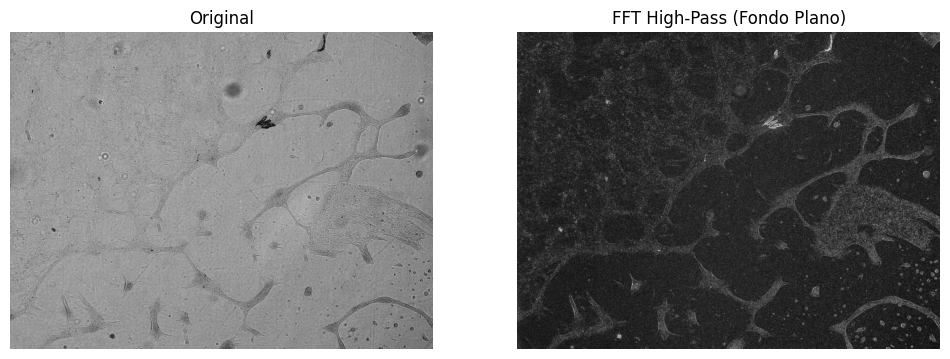

In [ ]:


def apply_fourier_highpass(image, radius=30):
    """
    Elimina frecuencias bajas (iluminación desigual) usando FFT.
    radius: Radio del círculo que bloquea las frecuencias bajas.
    """
    dft = np.fft.fft2(image)
    dft_shift = np.fft.fftshift(dft)

    rows, cols = image.shape
    crow, ccol = rows // 2, cols // 2

    # Crear máscara pasa-altos (círculo negro en el centro)
    mask = np.ones((rows, cols), np.uint8)
    center = [crow, ccol]
    x, y = np.ogrid[:rows, :cols]
    mask_area = (x - center[0])**2 + (y - center[1])**2 <= radius**2
    mask[mask_area] = 0

    # Aplicar máscara y volver al dominio espacial
    fshift = dft_shift * mask
    f_ishift = np.fft.ifftshift(fshift)
    img_back = np.fft.ifft2(f_ishift)
    img_back = np.abs(img_back)

    return cv2.normalize(img_back, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# --- Prueba de FFT ---
if 'all_images' in locals() and all_images:
    original = cv2.imread(str(all_images[10]), 0)
    img_fourier = apply_fourier_highpass(original, radius=10)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1); plt.title("Original"); plt.imshow(original, cmap='gray'); plt.axis('off')
    plt.subplot(1, 2, 2); plt.title("FFT High-Pass (Fondo Plano)"); plt.imshow(img_fourier, cmap='gray'); plt.axis('off')
    plt.show()

9. Transformada de DistanciaPropósito: Generar un mapa topográfico de intensidades donde el valor de cada píxel representa su distancia euclidiana mínima hacia el borde del objeto más cercano.
\
Justificación: Esta técnica convierte una máscara binaria rígida en un gradiente de información geométrica que resalta el eje central (esqueleto) y el grosor de los miotubos. Al identificar el centro de las estructuras con mayor intensidad, proporcionamos al modelo una pista crítica para el ajuste de las cajas de detección orientadas (OBB), facilitando la regresión de sus coordenadas centrales y ángulos de rotación. Matemáticamente, para cada píxel $p$ en el objeto, calculamos la distancia $D(p)$ al conjunto de píxeles del fondo $B$.

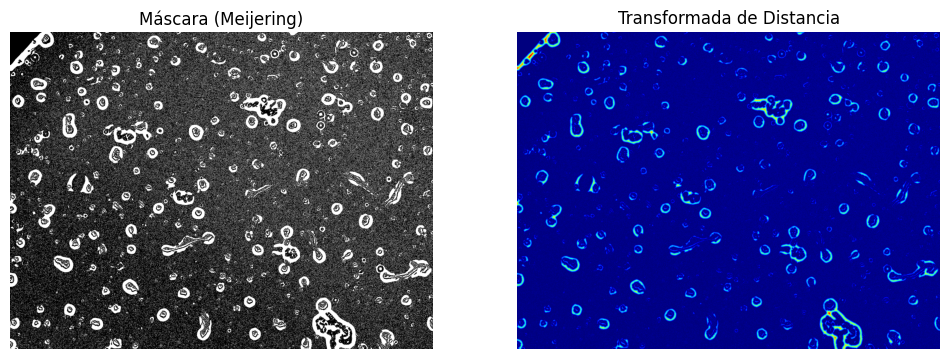

In [ ]:


def apply_distance_transform(binary_mask):
    """
    Calcula la distancia de cada píxel blanco al píxel negro más cercano.
    """
    # cv2.DIST_L2 es la distancia euclidiana estándar
    dist_transform = cv2.distanceTransform(binary_mask, cv2.DIST_L2, 5)

    # Normalizamos para visualizar
    return cv2.normalize(dist_transform, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# --- Bloque de Prueba ---
if 'all_images' in locals() and all_images:
    original = cv2.imread(str(all_images[0]), 0)

    # Usamos Meijering + Otsu para obtener una máscara menos agresiva
    # (Asumiendo que ya tienes la función apply_meijering definida)
    meij = apply_meijering(original, sigmas=range(1, 12, 2))
    _, mask = cv2.threshold(meij, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Aplicamos la Transformada de Distancia
    dist_img = apply_distance_transform(mask)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1); plt.title("Máscara (Meijering)"); plt.imshow(mask, cmap='gray'); plt.axis('off')
    plt.subplot(1, 2, 2); plt.title("Transformada de Distancia"); plt.imshow(dist_img, cmap='jet'); plt.axis('off')
    plt.show()

10. Filtros Direccionables (Steerable Ridge Detection)Propósito: Detectar crestas y estructuras lineales de forma eficiente, independientemente de su orientación espacial, mediante el análisis de la matriz Hessiana.
\
Justificación: Debido a que los miotubos se distribuyen en ángulos aleatorios dentro de la muestra, se requiere un método que no dependa de una dirección fija para su identificación. Este filtro descompone la imagen utilizando las segundas derivadas para construir una matriz Hessiana, de la cual se extraen los valores propios ($eigenvalues$) de la estructura local. Al capturar la respuesta del valor propio principal ($i_2$), logramos resaltar el eje longitudinal de la fibra celular con gran precisión, proporcionando una característica robusta que facilita la discriminación entre la entidad biológica y el ruido amorfo del fondo.

/tmp/ipython-input-56030484.py:8: FutureWarning: use_gaussian_derivatives currently defaults to False, but will change to True in a future version. Please specify this argument explicitly to maintain the current behavior
  H_elems = hessian_matrix(image, sigma=sigma, order='rc')


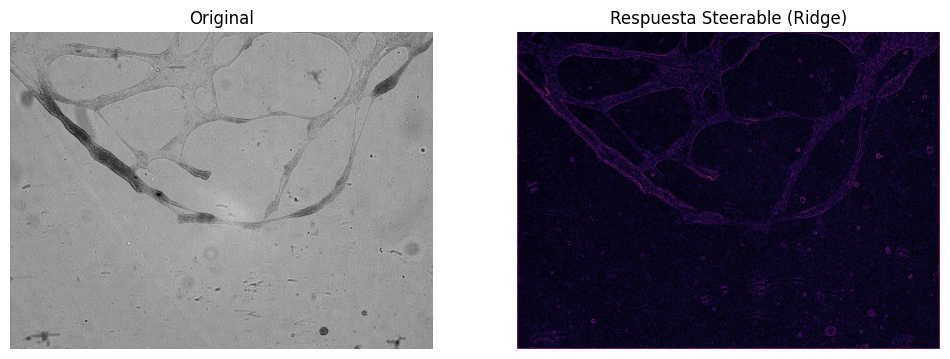

In [ ]:
def apply_steerable_ridge_detection(image, sigma=1.0):
    """
    Utiliza la matriz Hessiana para detectar crestas independientemente de su ángulo.
    Es una forma eficiente de implementar filtros direccionables de segundo orden.
    """
    # Calculamos los componentes de la matriz Hessiana
    # H = [[Ixx, Ixy], [Ixy, Iyy]]
    H_elems = hessian_matrix(image, sigma=sigma, order='rc')

    # Obtenemos los valores propios (eigenvalues)
    # El valor propio mayor resalta la estructura de la cresta
    i1, i2 = hessian_matrix_eigvals(H_elems)

    # Para miotubos claros sobre fondo oscuro, buscamos valores propios negativos mínimos
    # Normalizamos el resultado
    ridge_map = np.abs(i2) # i2 suele capturar la estructura tubular principal
    return cv2.normalize(ridge_map, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# --- Prueba de Steerable Filter ---
if 'all_images' in locals() and all_images:
    original = cv2.imread(str(all_images[2]), 0)
    steerable_res = apply_steerable_ridge_detection(original, sigma=2.0)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1); plt.title("Original"); plt.imshow(original, cmap='gray'); plt.axis('off')
    plt.subplot(1, 2, 2); plt.title("Respuesta Steerable (Ridge)"); plt.imshow(steerable_res, cmap='inferno'); plt.axis('off')
    plt.show()

Conclusión Técnica: El Pipeline de Selección Final
Tras evaluar exhaustivamente diversos métodos de procesamiento, hemos consolidado un Pseudo-RGB Stack como la entrada definitiva para el modelo de detección. Esta configuración transforma una imagen monocromática plana en un tensor de tres canales enriquecido, donde cada capa resuelve una limitación específica del dataset original.

Justificación del "Súper-Tensor" (Canal por Canal)
Canal Rojo (R) - CLAHE (Contexto y Textura): Se seleccionó como nuestra base de verdad realzada. A diferencia de los filtros estructurales, CLAHE no elimina información, sino que optimiza el contraste local. Esto asegura que el modelo conserve acceso a las texturas originales y a las fibras extremadamente tenues que podrían ser descartadas en pasos de binarización agresivos.

Canal Verde (G) - Filtro de Meijering (Conectividad Estructural): Fue el ganador indiscutible en las pruebas de realce de crestas (ridges). Su capacidad para mantener la continuidad de las fibras y su baja sensibilidad al ruido de fondo lo hacen superior a Frangi o Sato para este tipo de células. Este canal le entrega al modelo una red ya segmentada, reduciendo drásticamente el costo computacional de aprender a detectar estructuras lineales.

Canal Azul (B) - Transformada de Distancia (Guía Geométrica): Actúa como el descriptor geométrico para el ajuste de las cajas orientadas (OBB). Al convertir la máscara de Meijering en un mapa de distancias euclidianas, proporcionamos una señal donde la intensidad máxima coincide con el eje central de la fibra. Matemáticamente, facilita la regresión de las coordenadas centrales y el ángulo de rotación de los miotubos.

In [ ]:

def get_optimal_stack(image_path):
    """
    Crea un tensor de 3 canales optimizado para la detección de miotubos.
    Canal R: CLAHE (Detalle de textura y contraste local)
    Canal G: Meijering (Conectividad estructural de la red)
    Canal B: Transformada de Distancia (Geometría y eje central)
    """
    # 1. Cargar imagen en escala de grises
    img = cv2.imread(str(image_path), 0)
    if img is None: return None

    # --- Canal R: CLAHE ---
    # Resalta lo tenue sin quemar lo brillante
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    channel_r = clahe.apply(img)

    # --- Canal G: Filtro de Meijering ---
    # El ganador en realce de fibras. Usamos un rango de sigmas para grosores variados.
    meij_img = meijering(img, sigmas=range(1, 10, 2), black_ridges=False, mode='reflect')
    channel_g = cv2.normalize(meij_img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # --- Canal B: Transformada de Distancia ---
    # Binarizamos el Meijering (que ya viene limpio) para calcular distancias
    _, mask = cv2.threshold(channel_g, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    dist = cv2.distanceTransform(mask, cv2.DIST_L2, 5)
    channel_b = cv2.normalize(dist, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # Stack final
    return cv2.merge([channel_r, channel_g, channel_b]), channel_r, channel_g, channel_b

In [ ]:
def draw_yolo_obb(image, label_path):
    """
    Dibuja cajas orientadas (OBB) sobre una imagen.
    Asume formato YOLO OBB: class x1 y1 x2 y2 x3 y3 x4 y4 (normalizado)
    """
    img_viz = image.copy()
    if len(img_viz.shape) == 2: # Si es gris, pasar a RGB para ver color
        img_viz = cv2.cvtColor(img_viz, cv2.COLOR_GRAY2RGB)

    h, w = img_viz.shape[:2]

    if not label_path.exists():
        return img_viz

    with open(label_path, 'r') as f:
        for line in f.readlines():
            data = line.split()
            # Los puntos son del índice 1 al 8 (x1, y1, ..., x4, y4)
            points = np.array([float(x) for x in data[1:]]).reshape((4, 2))
            # Convertir de normalizado a píxeles
            points[:, 0] *= w
            points[:, 1] *= h
            points = points.astype(np.int32)

            # Dibujar el polígono de la caja orientada
            cv2.polylines(img_viz, [points], isClosed=True, color=(0, 255, 0), thickness=5)
    return img_viz

images_path = Path("/content/drive/MyDrive/Pregrado - Posgrado - Trabajo/Maestría - Inteligencia Artificial Aplicada/13. Proyecto integrador/Myotubes/data/yolo/train/images")
labels_path = Path("/content/drive/MyDrive/Pregrado - Posgrado - Trabajo/Maestría - Inteligencia Artificial Aplicada/13. Proyecto integrador/Myotubes/data/yolo/train/labels")

# Seleccionamos una muestra
sample_files = sorted(list(images_path.glob("*.png")))[:3]

for img_path in sample_files:
    # 1. Obtener el stack y los canales individuales
    stack, r, g, b = get_optimal_stack(img_path)
    original_grey = cv2.imread(str(img_path), 0)

    # 2. Localizar etiqueta
    label_file = labels_path / (img_path.stem + '.txt')

    # 3. Dibujar OBBs en cada versión
    viz_orig = draw_yolo_obb(original_grey, label_file)
    viz_stack = draw_yolo_obb(stack, label_file)
    viz_r = draw_yolo_obb(r, label_file)
    viz_g = draw_yolo_obb(g, label_file)
    viz_b = draw_yolo_obb(b, label_file)

    # --- Visualización en Grilla ---
    fig = plt.figure(figsize=(20, 12))
    plt.suptitle(f"Validación de Atributos con Ground Truth: {img_path.name}", fontsize=18)

    # Fila Superior: Original y Stack
    ax1 = plt.subplot2grid((2, 6), (0, 0), colspan=3)
    ax1.set_title("Original + OBB", fontsize=12)
    ax1.imshow(viz_orig)
    ax1.axis('off')

    ax2 = plt.subplot2grid((2, 6), (0, 3), colspan=3)
    ax2.set_title("Pseudo-RGB Stack + OBB", fontsize=12)
    ax2.imshow(viz_stack)
    ax2.axis('off')

    # Fila Inferior: Los 3 canales por separado
    ax3 = plt.subplot2grid((2, 6), (1, 0), colspan=2)
    ax3.set_title("Canal R: CLAHE + OBB", fontsize=12)
    ax3.imshow(viz_r)
    ax3.axis('off')

    ax4 = plt.subplot2grid((2, 6), (1, 2), colspan=2)
    ax4.set_title("Canal G: Meijering + OBB", fontsize=12)
    ax4.imshow(viz_g)
    ax4.axis('off')

    ax5 = plt.subplot2grid((2, 6), (1, 4), colspan=2)
    ax5.set_title("Canal B: Distancia + OBB", fontsize=12)
    ax5.imshow(viz_b)
    ax5.axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

# Conclusiones

En el contexto de CRISP-ML, la fase de Preparación de los datos tuvo como objetivo convertir un insumo crudo (imágenes de microscopía con bajo contraste y baja SNR) en un dataset listo para entrenamiento, con transformaciones reproducibles, justificadas y validadas para mejorar la señal útil y reducir variabilidad no relevante para el modelo.

A partir de la inspección del problema (miotubos con morfología elongada/filamentosa, contraste tenue e iluminación potencialmente no uniforme), se evaluó un conjunto de métodos deterministas de preprocesamiento y realce (CLAHE, filtros basados en Hessiana como Frangi y Meijering, morfología, umbralización adaptativa, difusión/TV, Gabor, FFT, transformada de distancia y detección de crestas). Esta exploración permitió identificar qué transformaciones preservan estructura (conectividad y continuidad de fibras) y cuáles tienden a introducir artefactos o fragmentar la señal.

Como resultado, se consolidó un pipeline final de entrada tipo "Pseudo-RGB Stack" que transforma cada imagen monocromática en un tensor de 3 canales complementarios, alineado con la idea de CRISP-ML de ingeniería de atributos orientada al desempeño del modelo:
* Canal R (CLAHE): actúa como "base de verdad" mejorada, elevando el contraste local sin descartar textura; mantiene información útil en fibras tenues que un enfoque binario podría eliminar.
* Canal G (Meijering): se seleccionó por su capacidad de resaltar estructuras filamentosas y ramificadas con buena continuidad y menor sensibilidad al ruido, entregando al modelo un mapa estructural más "limpio" que reduce el esfuerzo de aprender a suprimir fondo.
* Canal B (Transformada de distancia): aporta una pista geométrica explícita; al codificar distancia al borde desde una máscara derivada del canal estructural, enfatiza el eje central y el grosor relativo, lo cual es especialmente útil para tareas con cajas orientadas (OBB).

Finalmente, se realizó una validación cualitativa con ground truth al superponer las OBB sobre la imagen original, el stack y cada canal individual. En conclusión, esta fase entrega un dataset estandarizado, consistente y listo para el modelado, cumpliendo el propósito de CRISP-ML de preparar datos para maximizar aprendizaje útil y minimizar ruido operacional antes del modelado.